In [2]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from anndata import AnnData
from scipy.spatial.distance import cdist
# from Levenshtein import ratio, distance
from scipy.sparse import csr_matrix
from cellrank.tl.kernels import VelocityKernel
from cellrank.tl.kernels import PseudotimeKernel
from cellrank.tl.kernels import ConnectivityKernel
from cellrank.tl.estimators import GPCCA
# import capital as cp
# import palantir 
# import scFates as scf
%load_ext autoreload
%autoreload 2

In [3]:
import sys
stdout = sys.stdout

# some functions that mess up sys.stdout

sys.stdout = stdout

In [4]:
scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

In [8]:
adata = sc.read_h5ad('/nobackup1/saulv/pseudotime/arlotta.provided_umap.excitatory.scvelo.h5ad')

In [5]:
adata_highly_var = sc.read_h5ad('/nobackup1/saulv/pseudotime/arlotta.norm.high_var_only.regress_out.umap.filter_splice.excitatory.scvelo.h5ad')

In [7]:
vk = VelocityKernel(adata_highly_var)
vk.compute_transition_matrix()

Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/45746 [00:00<?, ?cell/s]

Setting `softmax_scale=3.4644`


  0%|          | 0/45746 [00:00<?, ?cell/s]

    Finish (0:01:39)


<VelocityKernel>

In [8]:
g = GPCCA(vk)
g.compute_schur(n_components=20)

Computing Schur decomposition
When computing macrostates, choose a number of states NOT in `[4, 8, 14, 17, 19]`
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:05)


In [ ]:
adata_highly_varta{}

In [16]:
adata.obs['Terminal_states'] = adata.obs['New_cellType']
adata.obs['Terminal_states'] = adata.obs['Terminal_states'].replace(["Apical progenitors", "Intermediate progenitors", "Immature neurons", "Migrating neurons"], 
                                                                     [np.NaN, np.NaN, np.NaN, np.NaN])


In [11]:
adata_highly_var.obs['Terminal_states'] = adata_highly_var.obs['New_cellType']
adata_highly_var.obs['Terminal_states'] = adata_highly_var.obs['Terminal_states'].replace(["Apical progenitors", "Intermediate progenitors", "Immature neurons", "Migrating neurons"], 
                                                                     [np.NaN, np.NaN, np.NaN, np.NaN])

In [12]:
g.set_terminal_states(adata_highly_var.obs['Terminal_states'])
g.compute_absorption_probabilities()

Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
Computing absorption probabilities


  0%|          | 0/8 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:01)


[0]PETSC ERROR: 

In [13]:
lineage_drivers = g.compute_lineage_drivers(lineages=None, return_drivers=True) # highly var

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:08)


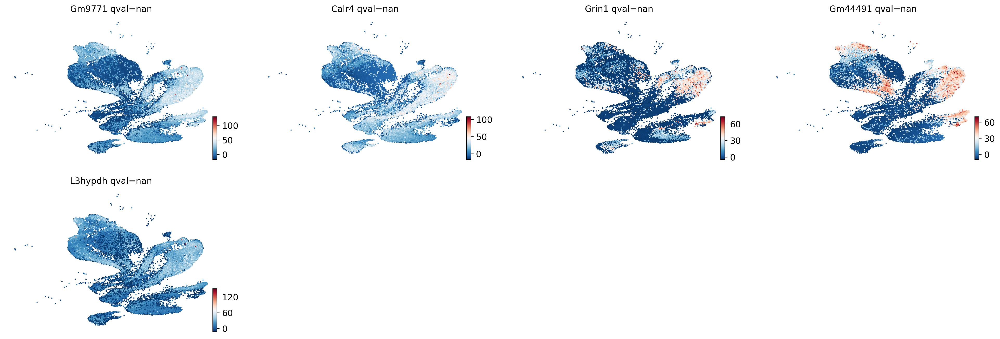

In [14]:
g.plot_lineage_drivers('SCPN', n_genes=5)

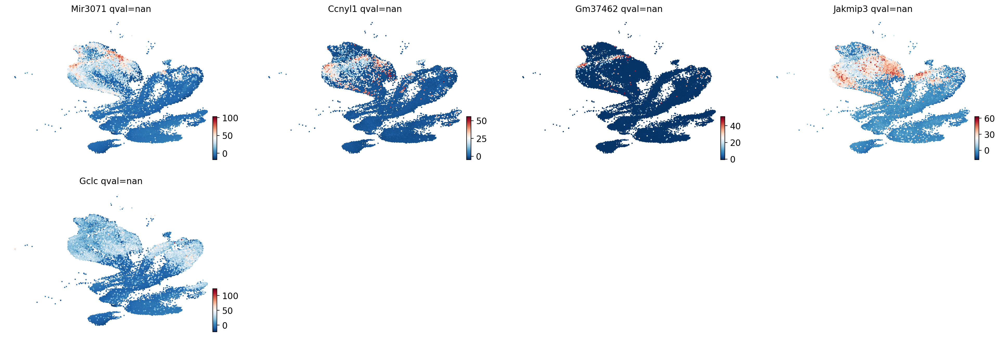

In [15]:
g.plot_lineage_drivers('DL CPN', n_genes=5)

In [19]:
lineage_drivers = g.compute_lineage_drivers(lineages='SCPN', return_drivers=True)

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:01:23)


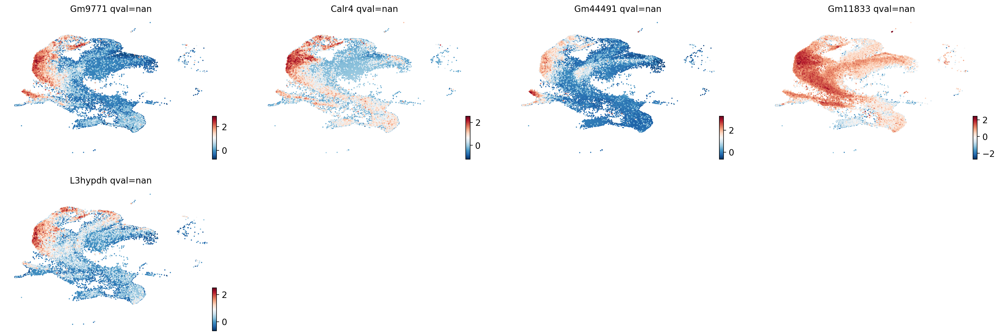

In [20]:
g.plot_lineage_drivers('SCPN', n_genes=5)

In [22]:
lineage_drivers = g.compute_lineage_drivers(lineages='DL CPN', return_drivers=True)

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:01:18)


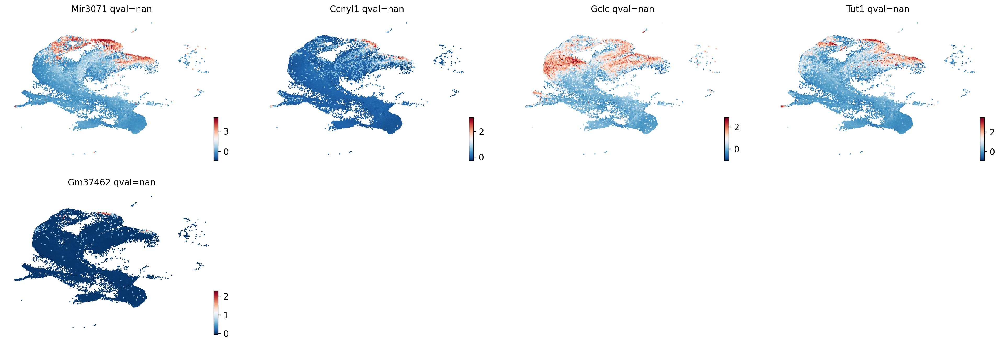

In [23]:
g.plot_lineage_drivers('DL CPN', n_genes=5)

In [24]:
lineage_drivers = g.compute_lineage_drivers(lineages=None, return_drivers=True)

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:01:25)


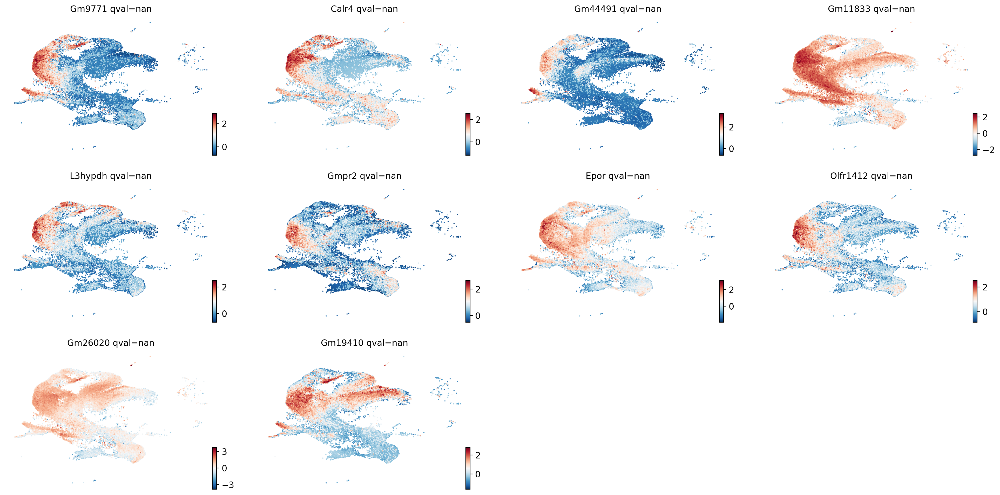

In [27]:
g.plot_lineage_drivers('SCPN', n_genes=10)

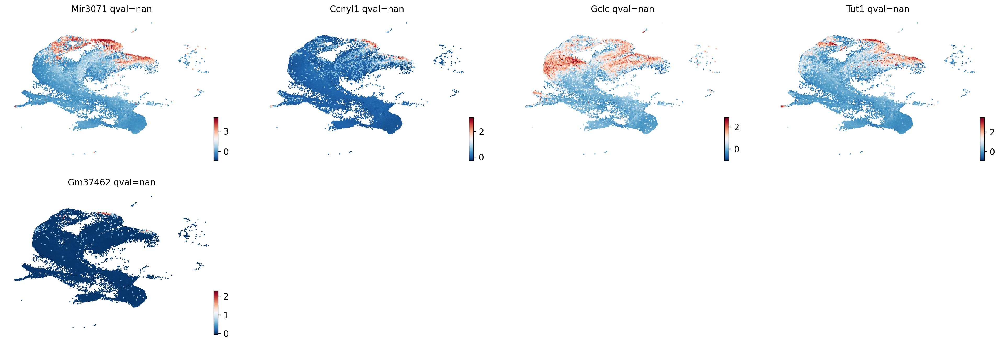

In [26]:
g.plot_lineage_drivers('DL CPN', n_genes=5)